3.1 RQ1: Can the availability of an Airbnb rental property in the next 30 days be predicted using the scores
and reviews that the property has received?

In [92]:
# ----- Import Statements ----- #
import numpy as np
import os
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt


In [93]:
# ----- Read CSV File Into Dataframe ----- #
filepath = './../London_data/'

dfListings = pd.read_csv(os.path.join(filepath, "listings.csv"))
dfListings.head(10)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,198258,https://www.airbnb.com/rooms/198258,20231210055232,2023-12-10,city scrape,Rental unit in Barking · ★4.74 · 1 bedroom · 1...,NaN,"I live in Barking town centre, at one time the...",https://a0.muscache.com/pictures/airflow/Hosti...,967537,...,4.88,4.45,4.68,NaN,f,1,0,1,0,0.27
1,33332,https://www.airbnb.com/rooms/33332,20231210055232,2023-12-10,city scrape,"Home in St Margaret's, Isleworth · ★4.40 · 1 ...",NaN,Peaceful and friendly.,https://a0.muscache.com/pictures/miso/Hosting-...,144444,...,4.53,4.68,4.26,NaN,f,2,0,2,0,0.12
2,42010,https://www.airbnb.com/rooms/42010,20231210055232,2023-12-10,city scrape,Home in East Finchley · ★4.88 · 1 bedroom · 1 ...,NaN,We have a unique cinema called the Phoenix whi...,https://a0.muscache.com/pictures/airflow/Hosti...,157884,...,4.95,4.73,4.87,NaN,t,2,0,2,0,3.45
3,284603,https://www.airbnb.com/rooms/284603,20231210055232,2023-12-11,previous scrape,Rental unit in London · ★4.83 · 1 bedroom · 1 ...,NaN,NaN,https://a0.muscache.com/pictures/3246231/8e9b1...,1481851,...,5.00,5.00,4.83,NaN,f,1,1,0,0,0.04
4,89870,https://www.airbnb.com/rooms/89870,20231210055232,2023-12-10,city scrape,Rental unit in London · ★4.65 · 1 bedroom · 1 ...,NaN,Finsbury Park is a friendly melting pot commun...,https://a0.muscache.com/pictures/miso/Hosting-...,54730,...,4.91,4.73,4.50,NaN,f,3,2,1,0,0.89
5,326146,https://www.airbnb.com/rooms/326146,20231210055232,2023-12-13,previous scrape,Rental unit in London · 1 bedroom · 1 bed,NaN,NaN,https://a0.muscache.com/pictures/3536712/9c7a9...,1667975,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
6,96052,https://www.airbnb.com/rooms/96052,20231210055232,2023-12-10,city scrape,Condo in London · ★4.82 · 2 bedrooms · 1 bed ·...,NaN,"Residential, quiet and green neighbourhood wit...",https://a0.muscache.com/pictures/airflow/Hosti...,448154,...,4.90,4.45,4.70,NaN,f,2,0,2,0,0.52
7,381467,https://www.airbnb.com/rooms/381467,20231210055232,2023-12-11,previous scrape,Rental unit in London · ★4.66 · 2 bedrooms · 2...,NaN,Peaceful and quite with beautiful tree lined s...,https://a0.muscache.com/pictures/4700556/fcce1...,1913410,...,4.82,4.88,4.64,NaN,f,1,1,0,0,1.86
8,390987,https://www.airbnb.com/rooms/390987,20231210055232,2023-12-10,city scrape,Home in London · ★4.73 · 8 bedrooms · 1 bed · ...,NaN,The neighbourhood is safe and many new cafes a...,https://a0.muscache.com/pictures/8841768/8130b...,1955537,...,4.83,4.75,4.75,NaN,f,3,0,3,0,0.09
9,394755,https://www.airbnb.com/rooms/394755,20231210055232,2023-12-11,previous scrape,Rental unit in London · 2 bedrooms · 2 beds · ...,NaN,NaN,https://a0.muscache.com/pictures/2b043814-44d7...,1973515,...,5.00,5.00,4.00,NaN,f,1,1,0,0,0.01


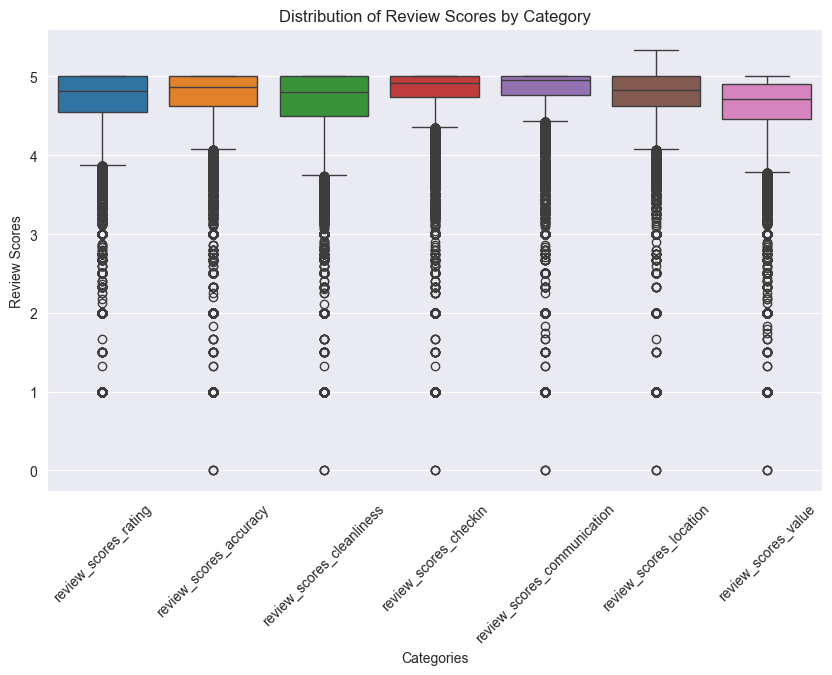

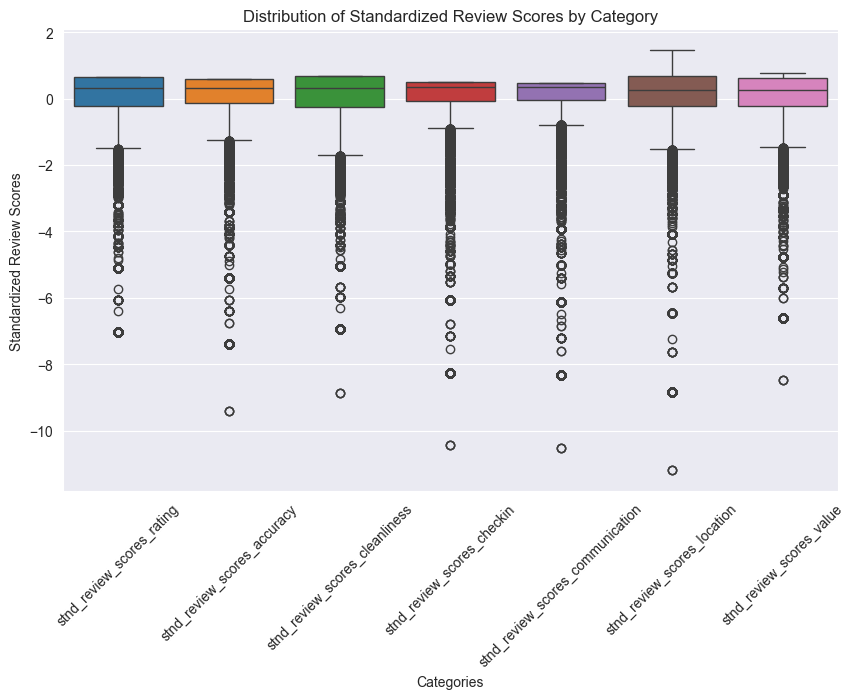

In [94]:
from sklearn.preprocessing import StandardScaler

# ----- Perform Feature Extraction ----- #
review_columns = ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value']

dfListings = dfListings[review_columns + ['availability_30'] + ['has_availability'] + ['number_of_reviews']]
dfListings = dfListings[dfListings['has_availability'] == 't']
dfListings.dropna(how='any', inplace=True)

# Create a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=dfListings[review_columns])
plt.title('Distribution of Review Scores by Category')
plt.xlabel('Categories')
plt.ylabel('Review Scores')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

dfScaled = dfListings
scaler = StandardScaler()
scaled_columns_stnd = ['stnd_' + review_column for review_column in review_columns]
dfScaled.loc[:,scaled_columns_stnd] = scaler.fit_transform(dfScaled[review_columns])

# Create a second boxplot of the scaled review scores
plt.figure(figsize=(10, 6))
sns.boxplot(data=dfScaled[scaled_columns_stnd])
plt.title('Distribution of Standardized Review Scores by Category')
plt.xlabel('Categories')
plt.ylabel('Standardized Review Scores')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

In [95]:
# ----- Feature Engineering ----- #
# Create a new feature to capture the average score that a property receives for all categories
dfScaled['avg_score'] = dfScaled[scaled_columns_stnd].mean(axis=1)

# Create a new feature to capture the average score that a listing receives for categories related 
# to the property.
prop_review_columns = ['stnd_review_scores_accuracy', 'stnd_review_scores_cleanliness', 'stnd_review_scores_location', 'stnd_review_scores_value']
dfScaled['avg_prop_score'] = dfScaled[prop_review_columns].mean(axis=1)

# Create a new feature to capture the average score that a listing receieves fpr categories related
# to the host.
host_review_columns = ['stnd_review_scores_communication', 'stnd_review_scores_checkin']
dfScaled['avg_host_score'] = dfScaled[host_review_columns].mean(axis=1)


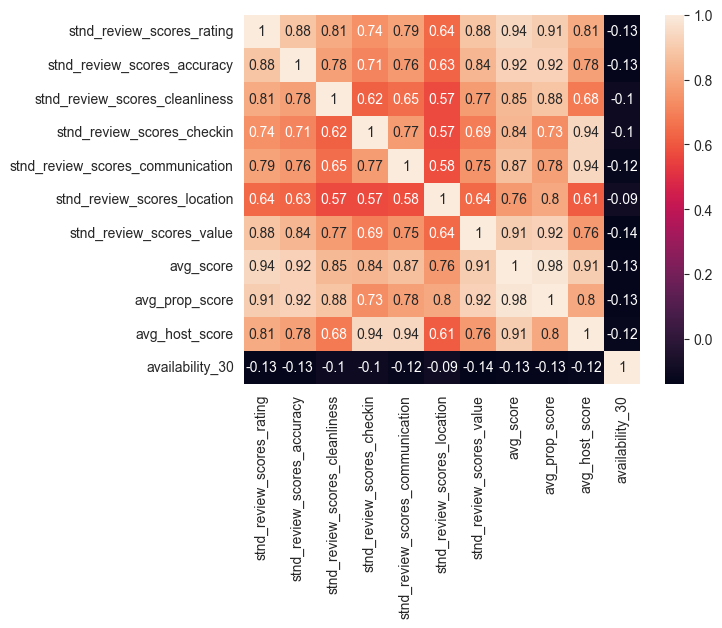

In [96]:
# ----- Perform Correlation Analysis ----- #
corr_3 = dfScaled[scaled_columns_stnd + ['avg_score'] + ['avg_prop_score'] + ['avg_host_score'] + ['availability_30']].corr(method='pearson').round(2)
corr_map_3 = sns.heatmap(corr_3, annot=True)

Mean availability_30 is: 11.572 km


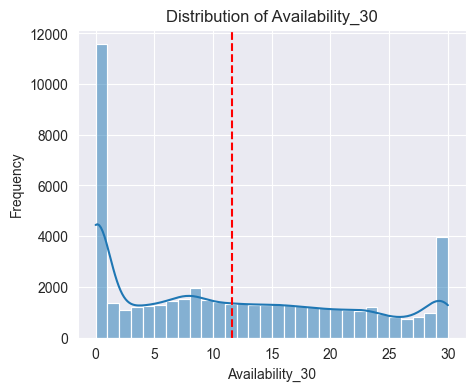

In [97]:
# Distribution of Availability_30
plt.figure(figsize=(5, 4))
sns.histplot(dfScaled['availability_30'], bins=30, kde=True)
# Calculate mean distance
mean_avail = dfScaled['availability_30'].mean()
print("Mean availability_30 is: {:.3f} km".format(mean_avail))
# Add mean as vertical line
plt.axvline(mean_avail, color='r', linestyle='--', label=f'Mean: {mean_avail:.2f} km')
plt.title(f'Distribution of Availability_30')
plt.xlabel('Availability_30')
plt.ylabel('Frequency')
plt.show()

In [99]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def train_test(model, train, test, x_columns, y_column):
    y_train = train[y_column]    
    y_test = test[y_column]
    x_train = train[x_columns]
    x_test = test[x_columns]

    # Evaluate performance with regular sale price
    model.fit(x_train, y_train)
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)
    print("RMSE train: {}".format(rmse(y_train, y_pred_train)))
    print("RMSE test: {}".format(rmse(y_test, y_pred_test)))

    return y_pred_train, y_pred_test

def plot_results(df_results, title, y_column):
    x_data = y_column
    y_data = 'pred_' + y_column
    fig_results = px.scatter(df_results, x=x_data, y=y_data, title=title, color='train_or_test')
    fig_results.add_shape(type='line', x0=0, y0=0, x1=df_results[x_data].max(), y1=df_results[x_data].max(),
    line=dict(color='red', dash='dash'), name='y=x')
    return fig_results

# ---- Create Model ----
model_GBR = GradientBoostingRegressor() 
model_linear = LinearRegression()
model_ridge = Ridge(alpha=0.5)
model_lasso = Lasso(alpha=0.1)
model_elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5)  
model_RF = RandomForestRegressor(max_depth=10, n_estimators=100, random_state=42)

# ---- Split into training/testing data ----
train, test = train_test_split(dfScaled, test_size=0.2, shuffle=True)
# Create copies of the training and testing data or comparison with Model B
copy_train_B = train.copy()
copy_test_B = test.copy()
copy_train_C = train.copy()
copy_test_C = test.copy()
copy_train_D = train.copy()
copy_test_D = test.copy()
copy_train_E = train.copy()
copy_test_E = test.copy()
x_columns = ['stnd_review_scores_rating', 'avg_prop_score', 'avg_host_score','number_of_reviews']

# ---- Model A ----
print("--- MODEL A ---")
y_pred_train, y_pred_test = train_test(model_linear, train, test, x_columns, 'availability_30')
train.loc[:, 'pred_availability_30'] = y_pred_train
train.loc[:, 'train_or_test'] = 'Train'
test.loc[:, 'pred_availability_30'] = y_pred_test
test.loc[:, 'train_or_test'] = 'Test'
results_A = pd.concat([train, test], ignore_index=True)
fig_results_A = plot_results(results_A, "Model A", 'availability_30')
fig_results_A.show()
    
# ---- Model B ----
print("--- MODEL B ---")
y_pred_train, y_pred_test = train_test(model_GBR, copy_train_B, copy_test_B, x_columns, 'availability_30')
copy_train_B.loc[:, 'pred_availability_30'] = y_pred_train
copy_train_B.loc[:, 'train_or_test'] = 'Train'
copy_test_B.loc[:, 'pred_availability_30'] = y_pred_test
copy_test_B.loc[:, 'train_or_test'] = 'Test'
results_B = pd.concat([copy_train_B, copy_test_B], ignore_index=True)

fig_results_B = plot_results(results_B, "Model B", 'availability_30')
fig_results_B.show()

# ---- Model C ----
print("--- MODEL C ---")
y_pred_train, y_pred_test = train_test(model_ridge, copy_train_C, copy_test_C, x_columns, 'availability_30')
copy_train_C.loc[:, 'pred_availability_30'] = y_pred_train
copy_train_C.loc[:, 'train_or_test'] = 'Train'
copy_test_C.loc[:, 'pred_availability_30'] = y_pred_test
copy_test_C.loc[:, 'train_or_test'] = 'Test'
results_C = pd.concat([copy_train_C, copy_test_C], ignore_index=True)

fig_results_C = plot_results(results_B, "Model C", 'availability_30')
fig_results_C.show()

# ---- Model D ----
print("--- MODEL D ---")
y_pred_train, y_pred_test = train_test(model_lasso, copy_train_D, copy_test_D, x_columns, 'availability_30')
copy_train_D.loc[:, 'pred_availability_30'] = y_pred_train
copy_train_D.loc[:, 'train_or_test'] = 'Train'
copy_test_D.loc[:, 'pred_availability_30'] = y_pred_test
copy_test_D.loc[:, 'train_or_test'] = 'Test'
results_D = pd.concat([copy_train_D, copy_test_D], ignore_index=True)

fig_results_D = plot_results(results_D, "Model D", 'availability_30')
fig_results_D.show()

# ---- Model E ----
print("--- MODEL E ---")
y_pred_train, y_pred_test = train_test(model_RF, copy_train_E, copy_test_E, x_columns, 'availability_30')
copy_train_E.loc[:, 'pred_availability_30'] = y_pred_train
copy_train_E.loc[:, 'train_or_test'] = 'Train'
copy_test_E.loc[:, 'pred_availability_30'] = y_pred_test
copy_test_E.loc[:, 'train_or_test'] = 'Test'
results_E = pd.concat([copy_train_E, copy_test_E], ignore_index=True)

fig_results_E = plot_results(results_E, "Model E", 'availability_30')
fig_results_E.show()

--- MODEL A ---
RMSE train: 9.839160945600284
RMSE test: 9.840738158410161


--- MODEL B ---
RMSE train: 9.694051008709616
RMSE test: 9.750504383675201


--- MODEL C ---
RMSE train: 9.839160945616038
RMSE test: 9.840738330368152


--- MODEL D ---
RMSE train: 9.839857183069418
RMSE test: 9.842173462285498


--- MODEL E ---
RMSE train: 9.381754487466921
RMSE test: 9.76576226102903
